# Data mining \& clustering


## SOYKOK Aylin 28711545 - CELIK Simay 28713301


The goal if this practical is to adress the folowing problem: 
<center style="color:red" >  Given XXX raw, unlabeled documents, ... How to exploit/understand/represent them?</center>

In the previous week, we have seen how to represent textual data with the Bag of Words (BoW) model:
$$X = 
	\begin{matrix} 
	 & \textbf{t}_j \\
	 & \downarrow \\
	\textbf{d}_i \rightarrow &
	\begin{pmatrix} 
	x_{1,1} & \dots & x_{1,d} \\
	\vdots & \ddots & \vdots \\
	x_{N,1} & \dots & x_{N,d} \\
	\end{pmatrix}
	\end{matrix}
	$$

From this BoW representation, we want to answer the following questions:
1. Which clustering algorithm to choose?
    - K-means, LSA, pLSA, LDA
1. What results to expect?
    - Semantics, noise cleaning, etc...
1. Which qualitative and quantitative analyses to understand the groups?
[comment]: <> (%1. Comment boucler, itérer pour améliorer la qualité du processus?)


<span style="color:magenta" > In this practical, we use a **labeled dataset** in order to evaluate performances with quantitative and well-defined metrics. </span>


In [2]:
import numpy as np
import matplotlib.pyplot as plt

import codecs
import re
import os.path
import sklearn
from wordcloud import WordCloud

## Data loading



In [3]:
from sklearn.datasets import fetch_20newsgroups
newsgroups_train = fetch_20newsgroups(subset='train')

In [4]:
# conversion BoW + tf-idf
from sklearn.feature_extraction.text import TfidfVectorizer
#vectorizer = TfidfVectorizer() 
vectorizer = TfidfVectorizer(max_df=0.95, min_df=2, max_features=1000, stop_words='english')

vectors = vectorizer.fit_transform(newsgroups_train.data)
print(vectors.shape)

# sparsity measure = 44 active words over 1000 per document (157 over 130000) !!
print(vectors.nnz / float(vectors.shape[0]))

(11314, 1000)
44.164928407283014


In [4]:
# retrieve words
print([(i,vectorizer.get_feature_names_out()[i]) \
       for i in np.random.randint(vectors.shape[1], size=10)])

[(695, 'players'), (363, 'evidence'), (694, 'player'), (558, 'll'), (942, 'using'), (318, 'digital'), (644, 'normal'), (687, 'pitt'), (694, 'player'), (291, 'david')]


In [5]:
# labels (only for evaluation)
Y = newsgroups_train.target
print(Y[:10]) 
print([newsgroups_train.target_names[i] for i in Y[:20]]) # vraie classe

[ 7  4  4  1 14 16 13  3  2  4]
['rec.autos', 'comp.sys.mac.hardware', 'comp.sys.mac.hardware', 'comp.graphics', 'sci.space', 'talk.politics.guns', 'sci.med', 'comp.sys.ibm.pc.hardware', 'comp.os.ms-windows.misc', 'comp.sys.mac.hardware', 'rec.motorcycles', 'talk.religion.misc', 'comp.sys.mac.hardware', 'sci.space', 'misc.forsale', 'alt.atheism', 'comp.graphics', 'rec.autos', 'sci.electronics', 'comp.windows.x']


# 0) Word clouds 
### Drawing word clouds from the raw corpus or words' frequencies :  [make word clouds !](https://github.com/amueller/word_cloud)

### Installation
If you are using pip:

`pip install wordcloud`

### If you are using conda, you can install from the conda-forge channel:

`conda install -c conda-forge wordcloud`

### Let's look at the most frequent words in this dataset

In [6]:
data = np.array(newsgroups_train.data)
corpus = "".join(data)
words = corpus.split() # optional args to choose the splitting chars
print("Nb mots=",len(words))
# Lets find the most frequence words Your code here

Nb mots= 3252437


### Plot the N frequent words and verify that its follows a Zipf law

In [7]:
from sklearn.feature_extraction.text import CountVectorizer
vectorizer = CountVectorizer()
X = vectorizer.fit_transform(newsgroups_train.data)
dic_size = X.shape[1]
words = vectorizer.get_feature_names_out()
word_freq = dict(zip(words, X.sum(axis=0).A1))
print(dic_size)
print(words)

130107
['00' '000' '0000' ... 'íålittin' 'ñaustin' 'ýé']


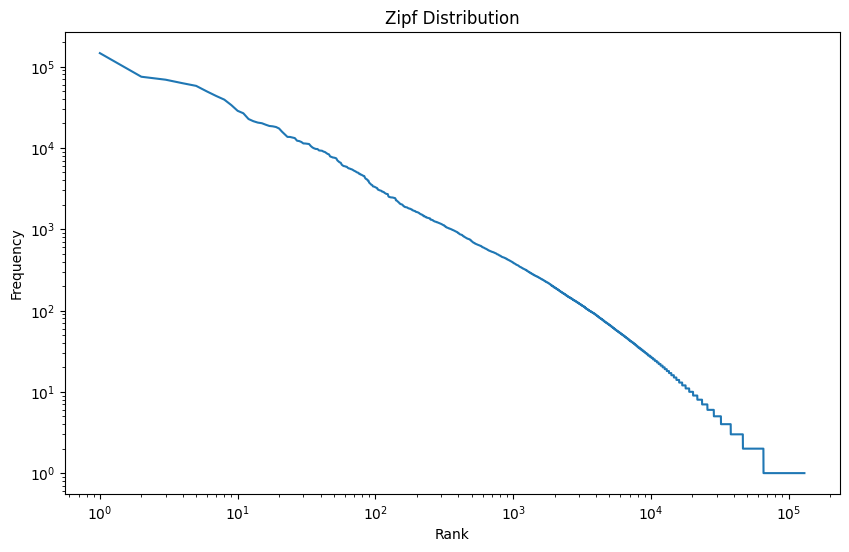

In [8]:
sorted_word_freq = sorted(word_freq.items(), key=lambda x: x[1], reverse=True)
frequencies = [freq for word, freq in sorted_word_freq]

plt.figure(figsize=(10, 6))
plt.plot(range(1, len(frequencies) + 1), frequencies)
plt.xlabel('Rank')
plt.ylabel('Frequency')
plt.title('Zipf Distribution')
plt.xscale('log')
plt.yscale('log')
plt.show()

Yes it follows Zipf law.

### Experiment word clouds

(-0.5, 399.5, 199.5, -0.5)

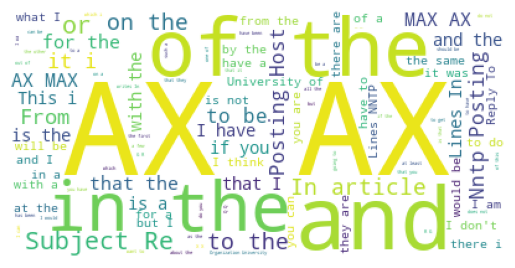

In [9]:
wordcloud = WordCloud(background_color='white', stopwords = [], max_words=100).generate(corpus)            

plt.figure()
plt.imshow(wordcloud)
plt.axis('off')

(-0.5, 399.5, 199.5, -0.5)

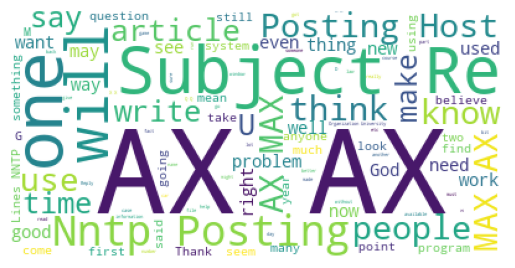

In [10]:
from wordcloud import STOPWORDS # Note: this is the default option           
wordcloud = WordCloud(background_color='white', stopwords = STOPWORDS, max_words=100).generate(corpus) 

plt.figure()
plt.imshow(wordcloud)
plt.axis("off")

### Use word clouds with generate\_from\_frequencies. 
N.B.: retrieve the most words frequencies using a CountVectorizer

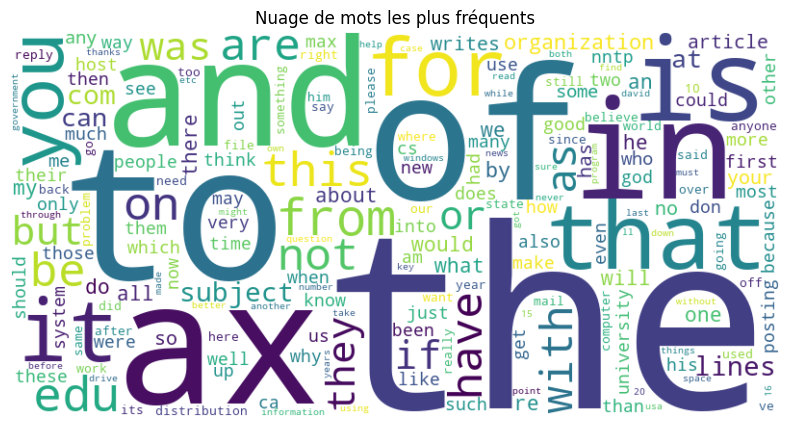

In [11]:
from wordcloud import WordCloud
wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(word_freq)
# Afficher le nuage de mots
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title("Nuage de mots les plus fréquents")
plt.show()

### Drawing word clouds from classes


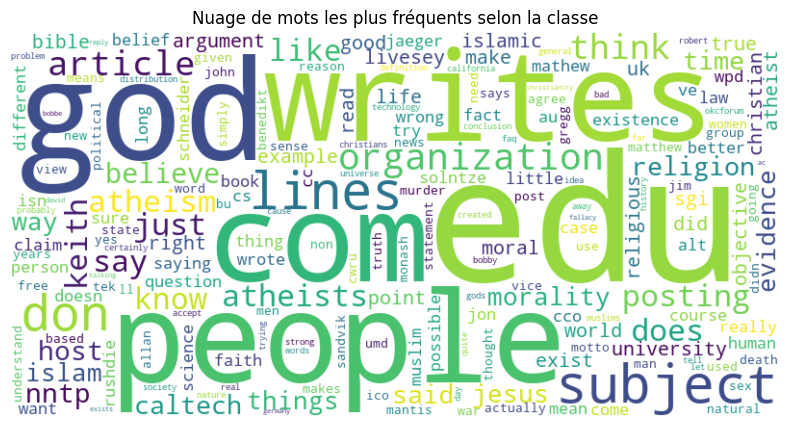

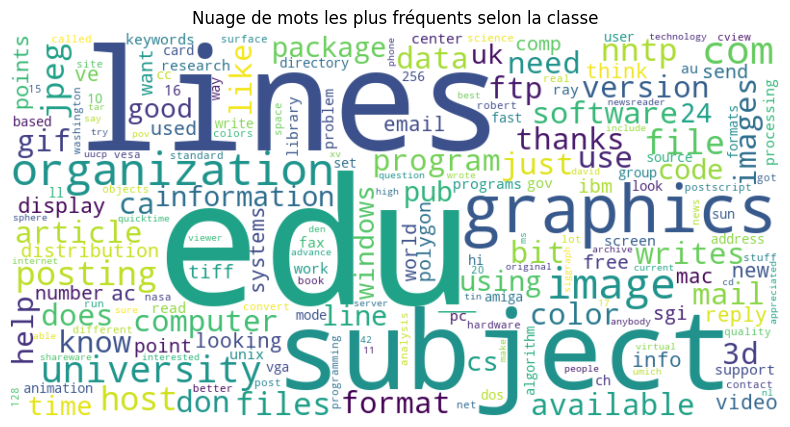

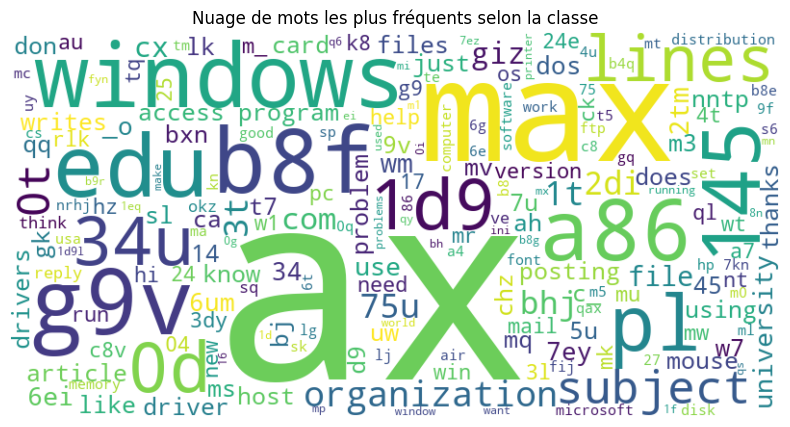

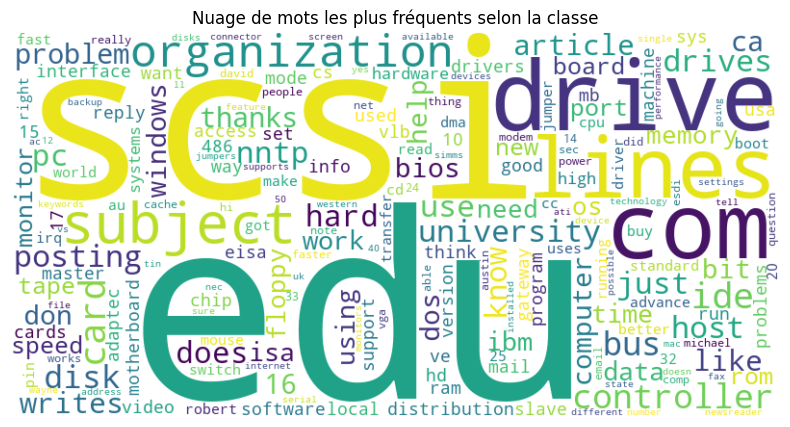

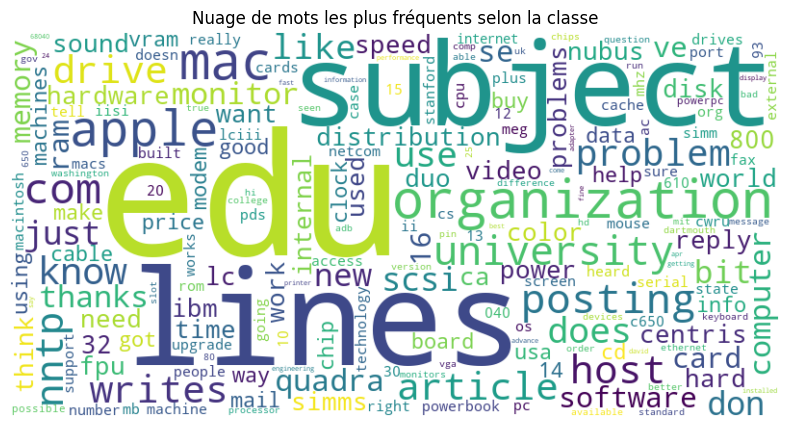

...

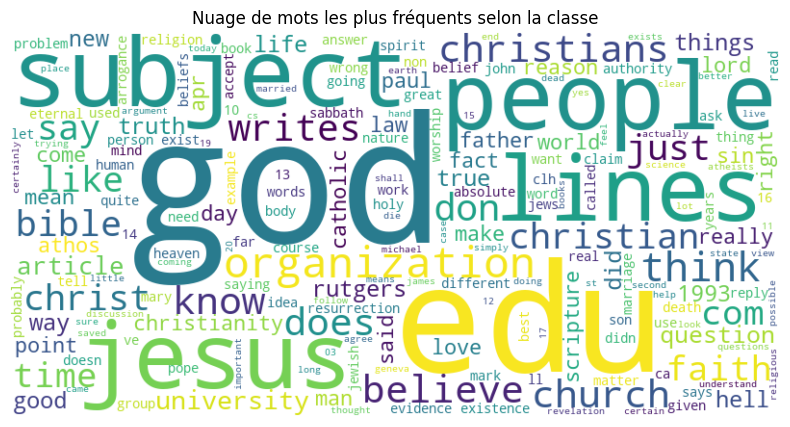

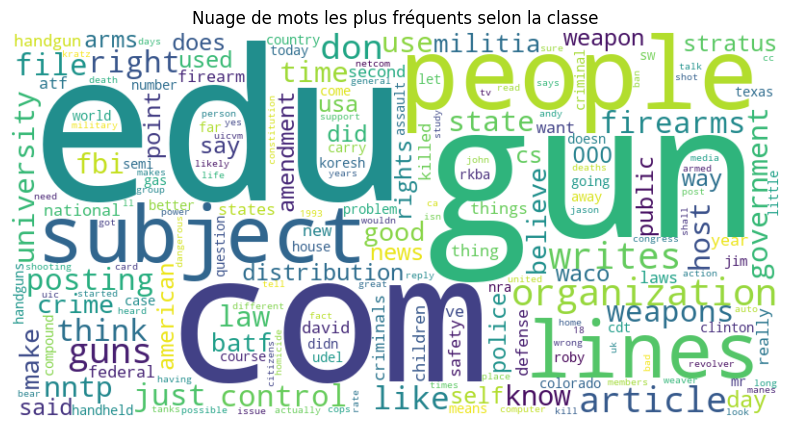

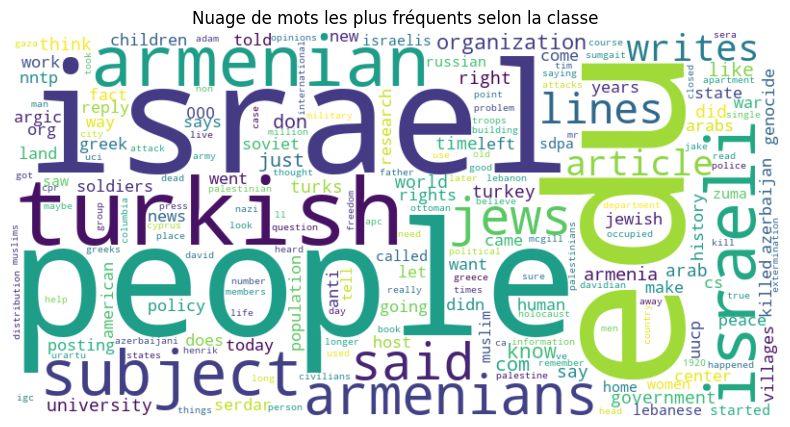

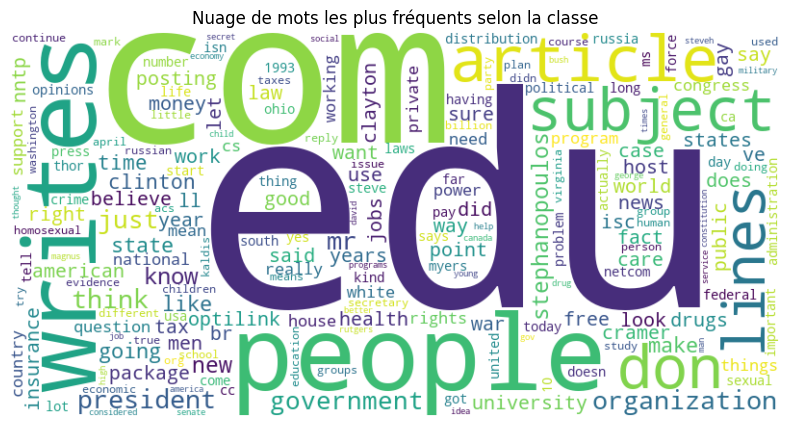

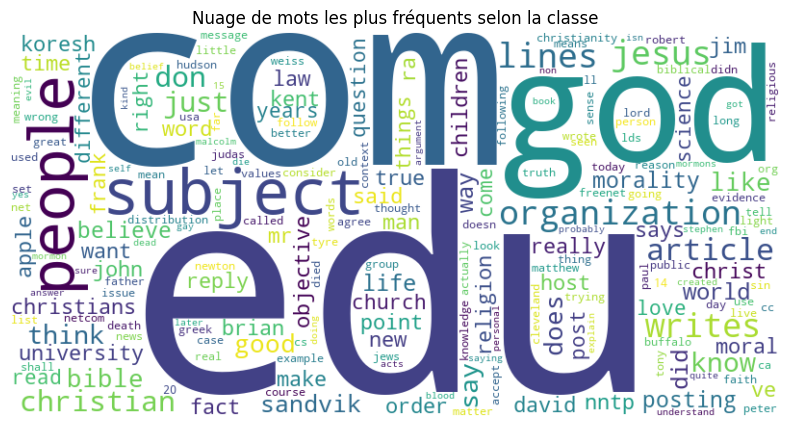

In [12]:
# Your code here
#for each class in target, 
diff_classes = np.unique(Y)
for y in diff_classes:
    index_list = np.where(Y==y)
    data_class = data[index_list]
    corpus = "".join(data_class)
    words = corpus.split() # optional args to choose the splitting chars
    vectorizer = CountVectorizer(stop_words="english")
    res = vectorizer.fit_transform(data_class)
    dic_size = res.shape[1]
    words = vectorizer.get_feature_names_out()
    word_freq = dict(zip(words, res.sum(axis=0).A1))
    wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(word_freq)
    # Afficher le nuage de mots
    plt.figure(figsize=(10, 5))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis('off')
    plt.title("Nuage de mots les plus fréquents selon la classe")
    plt.show()

# 1) Clustering algorithm: K-Means

**Let's start by the most famous and simple unsupervised algorithm: $k$-means!**
Look at [sklear documentation](https://scikit-learn.org/stable/modules/generated/sklearn.cluster.KMeans.html)
and apply it to your BoW matrix.


In [13]:
from sklearn.cluster import KMeans

# your code here
kmeans = KMeans(n_clusters=20, random_state=0, max_iter=10).fit(vectors)
# Getting clusters:
clusters = kmeans.cluster_centers_
clusters

array([[0.10756056, 0.02727664, 0.01102787, ..., 0.00212592, 0.00593682,
        0.00501284],
       [0.00523323, 0.01669429, 0.00168778, ..., 0.00636396, 0.00279291,
        0.0026637 ],
       [0.00212163, 0.00200874, 0.00086759, ..., 0.00221913, 0.00042353,
        0.        ],
       ...,
       [0.00234538, 0.00195804, 0.00063837, ..., 0.0051056 , 0.00321528,
        0.00236145],
       [0.00252404, 0.00392048, 0.002013  , ..., 0.00594924, 0.00468899,
        0.00315283],
       [0.00374857, 0.00500582, 0.00028979, ..., 0.00708021, 0.01223925,
        0.01180756]])

In [14]:
kmeans.labels_

array([ 1, 17, 14, ...,  7, 14, 17])

### Clustering Analysis: 
1. **Qualtitative:**
    - Look at the most important words for each cluster
    - Perform cluster assignement to each document, and compute word cloud on the document (raw text or frequencies)
2. **Quantitative:**
    - Compute cluster "purity": $p_j= |y^*_j|$, where $y^*_j$ is the most frequent (GT) label in cluster $C_j$ $\Rightarrow$ $p = \frac{1}{N}\sum\limits_j  p_j$
    - Compute [Rand Score](https://scikit-learn.org/stable/modules/generated/sklearn.metrics.rand_score.html) and [Adjusted Rand Score](https://scikit-learn.org/stable/modules/generated/sklearn.metrics.adjusted_rand_score.html#sklearn.metrics.adjusted_rand_score) 

In [15]:
#qualitative
#most important words
most_important_words = clusters.argmax(1)
print(len(most_important_words))
print("Most important words")
for clust,wrd in enumerate(vectorizer.get_feature_names_out()[most_important_words]):
    print((clust,wrd))


20
Most important words
(0, 'accepted')
(1, '1969')
(2, '232149')
(3, 'affect')
(4, '702')
(5, '45')
(6, '_need_')
(7, '9760')
(8, '_is')
(9, 'affairs')
(10, '95')
(11, 'ahriman')
(12, '1536')
(13, '1956')
(14, '245')
(15, '1970')
(16, '_antiquities')
(17, '245')
(18, '1qcq3f')
(19, 'admit')


In [16]:
#most important 10 words
#most important words
pred = kmeans.predict(vectors)
most_important_words = kmeans.cluster_centers_.argsort(axis=1)[:, -10:]
print(len(most_important_words))
print("Most important words")
for clust,wrd in enumerate(vectorizer.get_feature_names_out()[most_important_words]):
    print((clust,list(wrd)))

20
Most important words
(0, ['01742', '1qkn1t', '012537', '025426', '9874', '_actually_', '245', '011033', '00', 'accepted'])
(1, ['airtight', 'acts', '170493170457', '70', '456', '2610', '245', '1qcq3f', '1978', '1969'])
(2, ['1982', '1938', '245', '22', '50', '1qktj3', '238', '58t', 'accord', '232149'])
(3, ['1qcq3f', '245', '170493170457', '__', '_very_', '5590', 'airtight', 'affirmative', '140', 'affect'])
(4, ['abg', '150493181533', '1qcq3f', '47', '27300', '71', '1993apr1', '250', '19apr199310484591', '702'])
(5, ['30', '245', '1993apr18', '1993apr14', '1993apr15', '1883', '_is', '1993apr17', '68', '45'])
(6, ['1qk73q', 'accomplice', 'acsu', 'affirmation', '_no_one_', '245', '1qvk8sinn9vo', '459', '180493131125', '_need_'])
(7, ['230', '77', '1r22qp', '245', '170493170457', 'airtight', 'achaemenid', '112', '1qcq3f', '9760'])
(8, ['170493104312', '170259', '6dx', '245', 'aerosols', '4940', '47', '666', '6649', '_is'])
(9, ['99', 'airtight', '596', 'abhor', 'affirmative', 'agencies

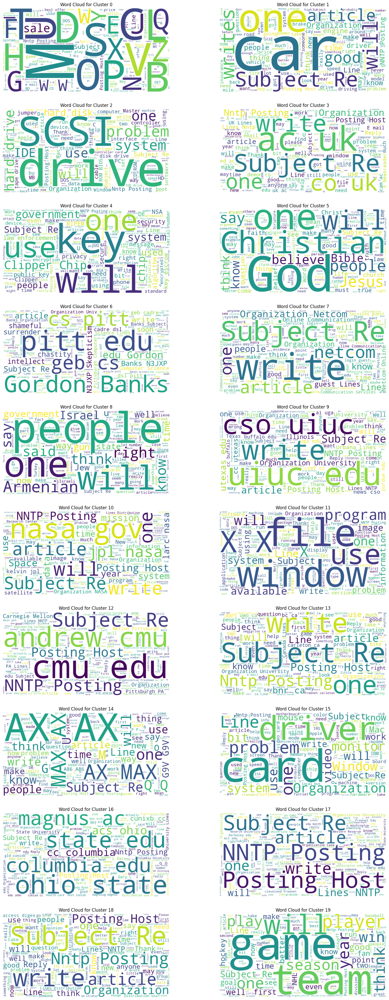

In [17]:
#cluster assignments
fig, axs = plt.subplots(10, 2, figsize=(20, 50))
axs = axs.flatten() 

for i in range(20):
    cluster_indices = np.where(kmeans.labels_ == i)[0]
    cluster_texts = [newsgroups_train.data[idx] for idx in cluster_indices]
    cluster_wordcloud = WordCloud(width=800, height=400, background_color='white').generate(' '.join(cluster_texts))
    axs[i].imshow(cluster_wordcloud, interpolation='bilinear')
    axs[i].set_title(f'Word Cloud for Cluster {i}')
    axs[i].axis('off')

In [18]:
#quantitative
unique_labels = np.unique(pred)

cluster_purity = []
for i in range(20):
    cluster_indices = np.where(pred == i)[0]
    cluster_labels = [Y[idx] for idx in cluster_indices]
    most_frequent_label = max(set(cluster_labels), key=cluster_labels.count)
    cluster_purity.append(cluster_labels.count(most_frequent_label) / len(cluster_labels))
average_purity = np.mean(cluster_purity)
print("Avg Cluster Purity:", average_purity)



Avg Cluster Purity: 0.40417162018527025


In [19]:
from sklearn.metrics import adjusted_rand_score, rand_score
rand_score_value = rand_score(pred, Y)
print("Rand Score:", rand_score_value)
adjusted_rand_score_value = adjusted_rand_score(pred, Y)
print("Adjusted Rand Score:", adjusted_rand_score_value)

Rand Score: 0.8823682422919308
Adjusted Rand Score: 0.10730567395686359


# 2) Latent Semantic Analysis (LSA <=> SVD) 


**Remember the LSA factorziation**: 
$$ 
\begin{matrix} 
 & X  &\!\!\!\!\!=\!\!\!\!\!& U  & \Sigma & V^T \\
  & \textbf{t}_j   &  & \hat{ \textbf{d}_i} & &  \\
 & \downarrow  &  &\downarrow  & & \\
\textbf{d}_i \rightarrow 
&
\begin{pmatrix} 
x_{1,1} & \dots & x_{1,d} \\
\\
\vdots & \ddots & \vdots \\
\\
x_{N,1} & \dots & x_{N,d} \\
\end{pmatrix}
&
\!\!\!\!\!=\!\!\!\!\!
%&
%(\hat{ \textbf{t}_j}) \rightarrow
&
\begin{pmatrix} 
\begin{pmatrix} &  \textbf{u}_1 &  \end{pmatrix} \\
\vdots \\
\begin{pmatrix}  & \textbf{u}_k &  \end{pmatrix}
\end{pmatrix}
%&
%\!\!\!\!\!\cdot\!\!\!\!\!
&
\begin{pmatrix} 
\sigma_1 & \dots & 0 \\
\vdots & \ddots & \vdots \\
0 & \dots & \sigma_k \\
\end{pmatrix}
%&
%\!\!\!\!\!\cdot\!\!\!\!\!
&
\begin{pmatrix} 
\begin{pmatrix} \, \\ \, \\ \textbf{v}_1 \\ \, \\ \,\end{pmatrix} 
\dots
\begin{pmatrix} \, \\ \, \\ \textbf{v}_k \\ \, \\ \, \end{pmatrix}
\end{pmatrix}
\end{matrix}
$$

- Look at [SVD doc in skelarn](https://scikit-learn.org/stable/modules/generated/sklearn.decomposition.TruncatedSVD.html#sklearn.decomposition.TruncatedSVD)
- Do the same qualitative/quantitative evaluation than with K-Means
- You can also use LSA as a pre-processing step for K-Means, *i.e.* running K-Means on $\boldsymbol{U}$ matrix above
    - N.B. : try without/with $\ell_2$ normalization of $\boldsymbol{U}$'s rows before running  K-Means
    - You can also benefit from LSA pre-processing for using [t-SNE visualization](https://scikit-learn.org/stable/modules/generated/sklearn.manifold.TSNE.html) (see code below)


In [20]:
# t-SNE from the U matrix computed by LSA
from sklearn.manifold import TSNE
from sklearn.decomposition import TruncatedSVD
n_components = 100 
svd = TruncatedSVD(n_components=n_components, random_state=0)
U = svd.fit_transform(vectors)

tsne = TSNE(n_components=2, init='pca',n_iter=5000, verbose=2)
tsne_mat = tsne.fit_transform(U)

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 11314 samples in 0.003s...
[t-SNE] Computed neighbors for 11314 samples in 0.552s...
[t-SNE] Computed conditional probabilities for sample 1000 / 11314
[t-SNE] Computed conditional probabilities for sample 2000 / 11314
[t-SNE] Computed conditional probabilities for sample 3000 / 11314
[t-SNE] Computed conditional probabilities for sample 4000 / 11314
[t-SNE] Computed conditional probabilities for sample 5000 / 11314
[t-SNE] Computed conditional probabilities for sample 6000 / 11314
[t-SNE] Computed conditional probabilities for sample 7000 / 11314
[t-SNE] Computed conditional probabilities for sample 8000 / 11314
[t-SNE] Computed conditional probabilities for sample 9000 / 11314
[t-SNE] Computed conditional probabilities for sample 10000 / 11314
[t-SNE] Computed conditional probabilities for sample 11000 / 11314
[t-SNE] Computed conditional probabilities for sample 11314 / 11314
[t-SNE] Mean sigma: 0.163316
[t-SNE] Computed cond

C:\Users\PC\AppData\Local\Temp\ipykernel_16820\2894199183.py:5: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap('hsv', 20)
C:\Users\PC\AppData\Local\Temp\ipykernel_16820\2894199183.py:6: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap('jet', 20)


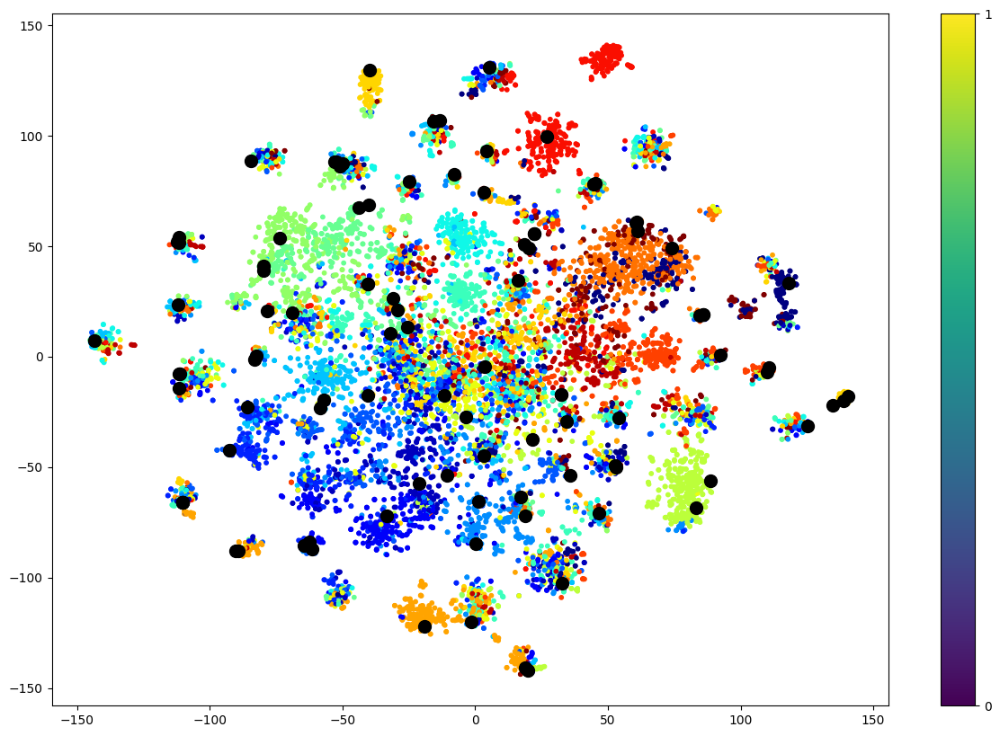

In [21]:
NN2cluster = np.argmax(np.abs(U), axis=0)
#import seaborn as sns
import matplotlib.cm as cm
cmap = cm.tab20
cmap = cm.get_cmap('hsv', 20) 
cmap = cm.get_cmap('jet', 20)
#cmap = cm.tab20

plt.figure(figsize=(15,10))
plt.scatter(tsne_mat[:,0],tsne_mat[:,1], c=Y, cmap=cmap, s=10)
plt.scatter(tsne_mat[NN2cluster[:],0],tsne_mat[NN2cluster[:],1], c='black', s=100)
#plt.scatter(tsne_mat[NN2cluster2[:],0],tsne_mat[NN2cluster2[:],1], c='red', s=100)
plt.colorbar(ticks=range(20))

# 3) Latent Dirichlet Allocation (LDA)

Perform the same experiments with LDA:
- LDA
https://scikit-learn.org/stable/modules/generated/sklearn.decomposition.LatentDirichletAllocation.html


**Start with a CountVectorizer**

In [10]:
from nltk.tokenize import RegexpTokenizer
from sklearn.feature_extraction.text import CountVectorizer

# Initialize regex tokenizer
tokenizer = RegexpTokenizer(r'\w+')

# Vectorize document using TF-IDF
vectorizer = CountVectorizer(lowercase=True,
                        stop_words='english',
                        ngram_range = (1,1),
                        tokenizer = tokenizer.tokenize, max_df=0.95, min_df=2, max_features=1000)

vectors = vectorizer.fit_transform(newsgroups_train.data)
print(vectors.shape)
print(vectors.nnz / float(vectors.shape[0]))



c:\Users\PC\miniconda3\Lib\site-packages\sklearn\feature_extraction\text.py:525: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn(


(11314, 1000)
48.02527841612162


## LDA-viz

In [12]:
#!pip install install pyldavis
from __future__ import print_function

import pyLDAvis
import pyLDAvis.sklearn
pyLDAvis.enable_notebook()

from sklearn.decomposition import LatentDirichletAllocation
num_topics = 10 
lda = LatentDirichletAllocation(n_components=num_topics, random_state=0)
lda.fit(vectors)

pyLDAvis.sklearn.prepare(lda,vectors,vectorizer)

ModuleNotFoundError: No module named 'pyLDAvis.sklearn'

# Performances evaluation

**Compare the different approaches wrt three quantitative metrics.**